# 13 Processing XMLs from https://extract.bbbike.org/

## Two main issues when processing XMLs:
- The whole of the XML has to be processed before filtering by tags (can cause kernel crashes even on quite small areas)
- XMLs often contain clipped, incomplete geometries

On a laptop with 8GB memory, maximum XML filesize uncompressed of about 90MB

To avoid these issues the other functions that get data from the overpass API are more robust

# 13 Processing XMLs from https://extract.bbbike.org/

***2 Sep 2020***

- Primarily for visual comparison with [openstreetmap.org](https://www.openstreetmap.org)
- this notebook processes a selection of XML extracts downloaded from https://download.bbbike.org/osm/extract/

### Notes

- When processing the XMLs the whole of the XML has to processed, the tag filters can only be applied at the end
    - This means the area that can be processed from an XML may be quite small before memory issues are encountered
- Quite a large amount of geometry may need to be processed to extract quite a small amount of data
    - Files approximately > 90MB caused the kernel to crash
- Not passing in any tags or polygon will try to process whatever is in the XML to geometry
- XMLs seem to include clipped, incomplete geometries for example:
    - a line crossing the boundary will be included but only one node will be included
    - this causes empty geometries
- The Overpass API returns all of the data for geometries that overlap the edge of a query area

In [2]:
%load_ext autoreload
%autoreload 2

import geopandas as gpd
import osmnx as ox # using `geometries` branch
ox.utils.config(use_cache=True, log_console=True)

from helper_functions import carto_plot

local_file_path = '/media/nick/WDBlue/osmnx/XML/bbbike.org/'

## Torino

https://www.openstreetmap.org/node/5929146182#map=17/45.06184/7.66533, 587kB

<AxesSubplot:>

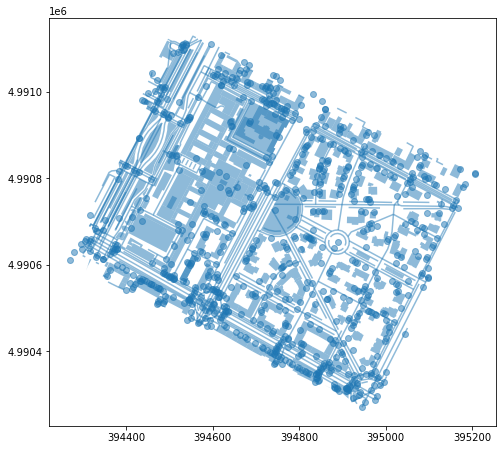

In [6]:
osmnx_result = ox.geometries_from_xml(local_file_path + 'planet_7.657_45.061_815df0e7.osm')
osmnx_result = ox.project_gdf(osmnx_result)
osmnx_result.plot(figsize=(8,8), alpha=0.5)

/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarn

(<Figure size 1152x1152 with 1 Axes>, <AxesSubplot:>)

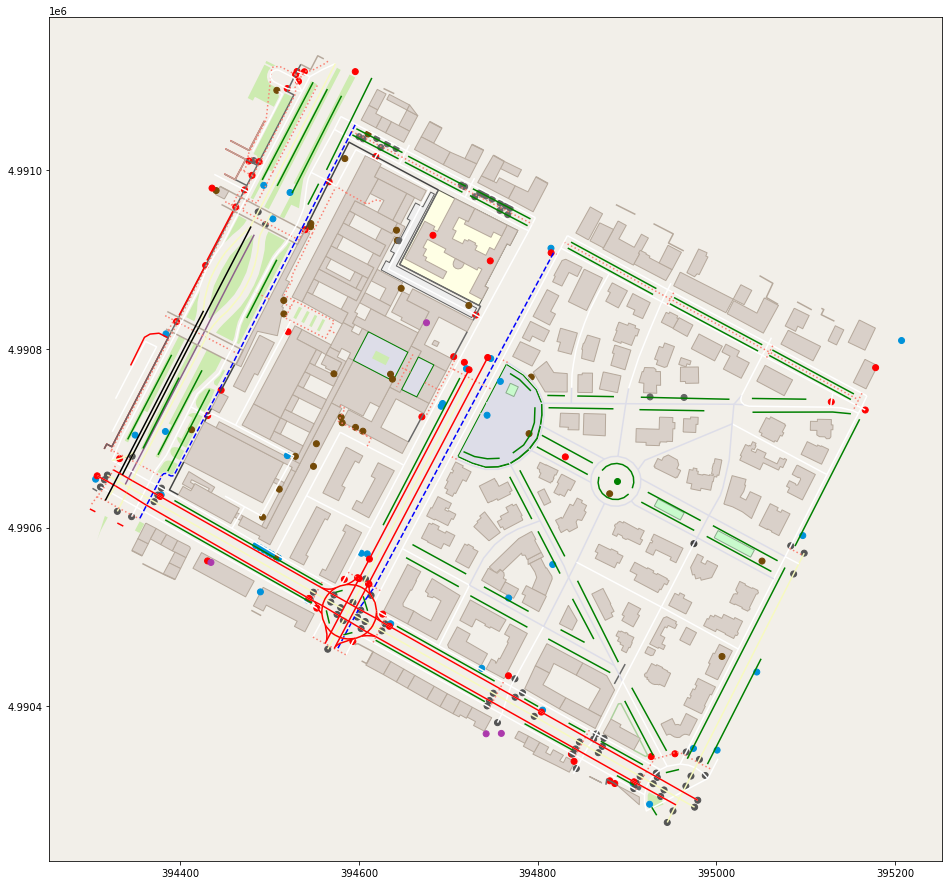

In [7]:
carto_plot(osmnx_result)

### 471kB


<AxesSubplot:>

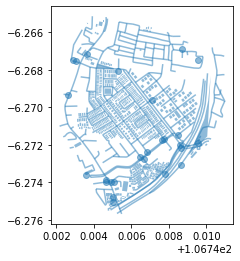

In [5]:
gdf = ox.geometries_from_xml(local_file_path + 'planet_106.742_-6.271_816780c3.osm')
gdf.plot(alpha=0.5)

### 967kB

<AxesSubplot:>

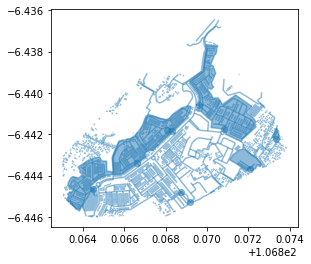

In [7]:
gdf = ox.geometries_from_xml(local_file_path + 'planet_106.863_-6.445_78b19332.osm')
gdf.plot(alpha=0.5)

<AxesSubplot:>

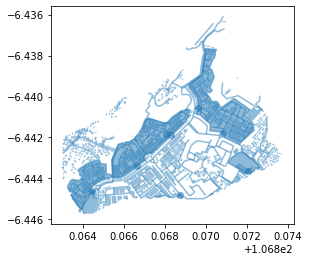

In [8]:
gdf = ox.geometries_from_xml(local_file_path + 'planet_106.864_-6.446_f69a6ad6.osm')
gdf.plot(alpha=0.5)

### 543kB

<AxesSubplot:>

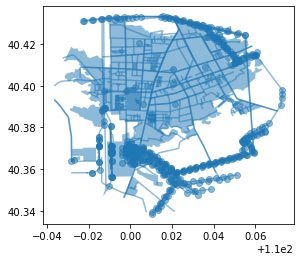

In [9]:
gdf = ox.geometries_from_xml(local_file_path + 'planet_109.974_40.352_4e0115ff.osm')
gdf.plot(alpha=0.5)

### 9MB

https://www.openstreetmap.org/#map=14/23.1145/113.2559

<AxesSubplot:>

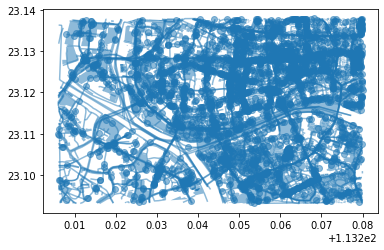

In [10]:
gdf = ox.geometries_from_xml(local_file_path + 'planet_113.206,23.093_113.28,23.138.osm')
gdf.plot(alpha=0.5)

/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarn

(<Figure size 1728x1728 with 1 Axes>, <AxesSubplot:>)

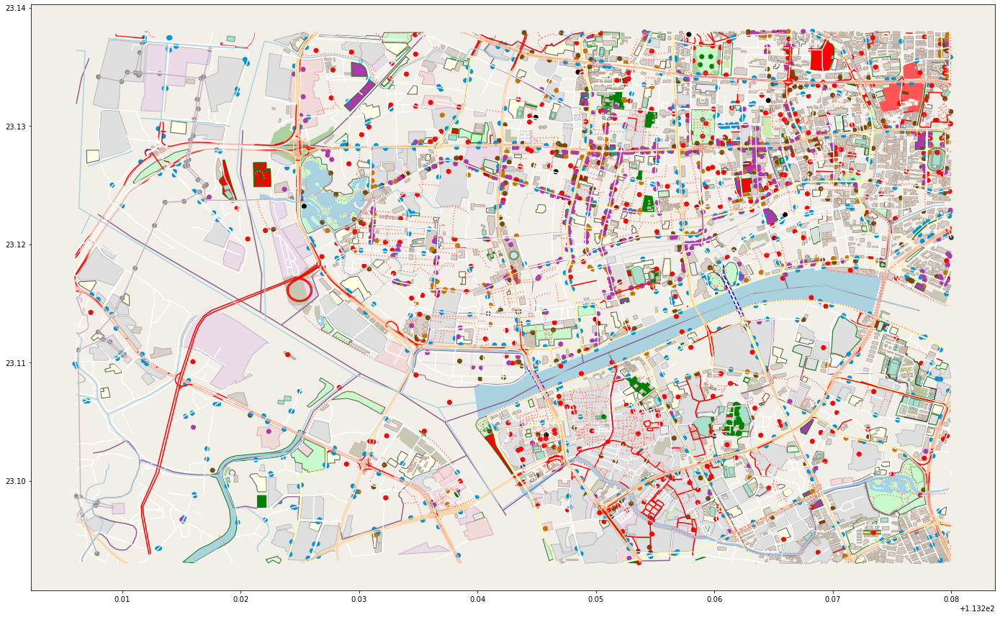

In [11]:
carto_plot(gdf)

In [12]:
#113.206,23.093_113.28,23.138
tags={'place': True, 'natural': True, 'landuse': True,
      'leisure': True, 'amenity': True, 'waterway': True,
      'highway': True, 'aeroway': True, 'aerialway': True,
      'building': True, 'shop': True}
gdf = ox.geometries_from_bbox(23.138,23.093,113.206,113.28,
                              tags=tags)

/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarn

(<Figure size 1728x1728 with 1 Axes>, <AxesSubplot:>)

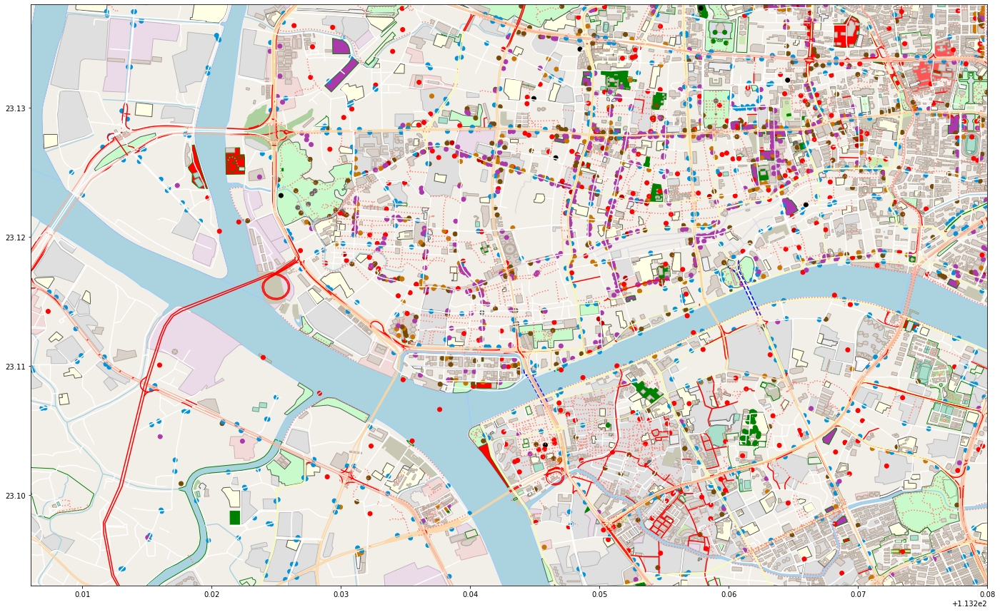

In [15]:
carto_plot(gdf, tags=tags, top=23.138, bottom=23.093, left=113.206, right=113.28)

### 8.7MB

https://www.openstreetmap.org/#map=16/35.6584/139.7026

<AxesSubplot:>

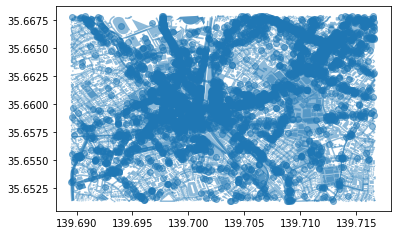

In [16]:
gdf = ox.geometries_from_xml(local_file_path + 'planet_139.68947,35.65129_139.71667,35.66789.osm')
gdf.plot(alpha=0.5)

/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarn

(<Figure size 1728x1728 with 1 Axes>, <AxesSubplot:>)

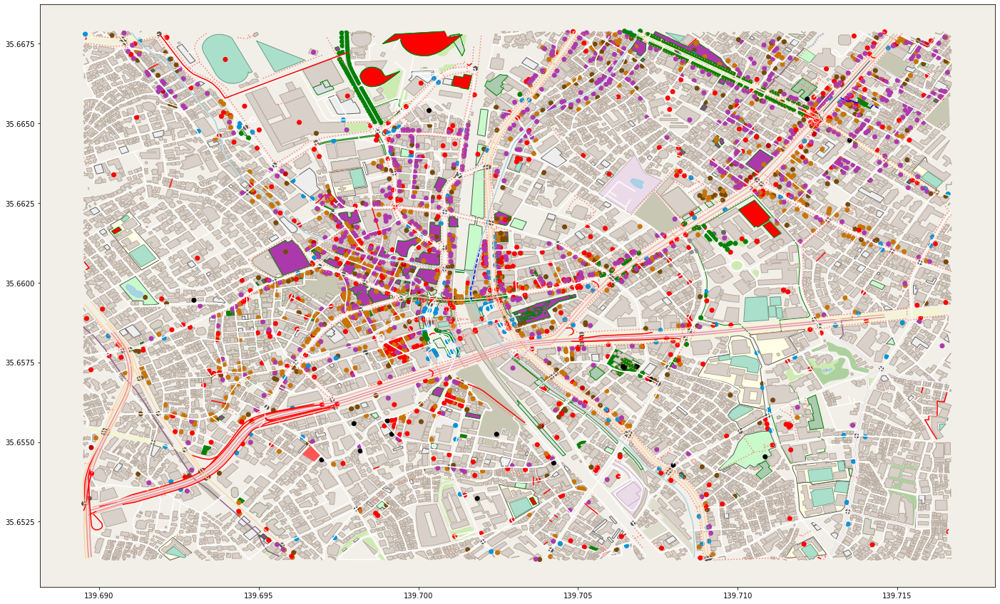

In [17]:
carto_plot(gdf)

### 63.7MB

https://www.openstreetmap.org/#map=10/-40.4553/175.4558

<AxesSubplot:>

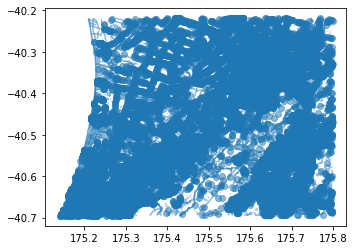

In [18]:
gdf = ox.geometries_from_xml(local_file_path + 'planet_175.113_-40.219_684ad0b4.osm')
gdf.plot(alpha=0.5)

/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarn

(<Figure size 1728x1728 with 1 Axes>, <AxesSubplot:>)

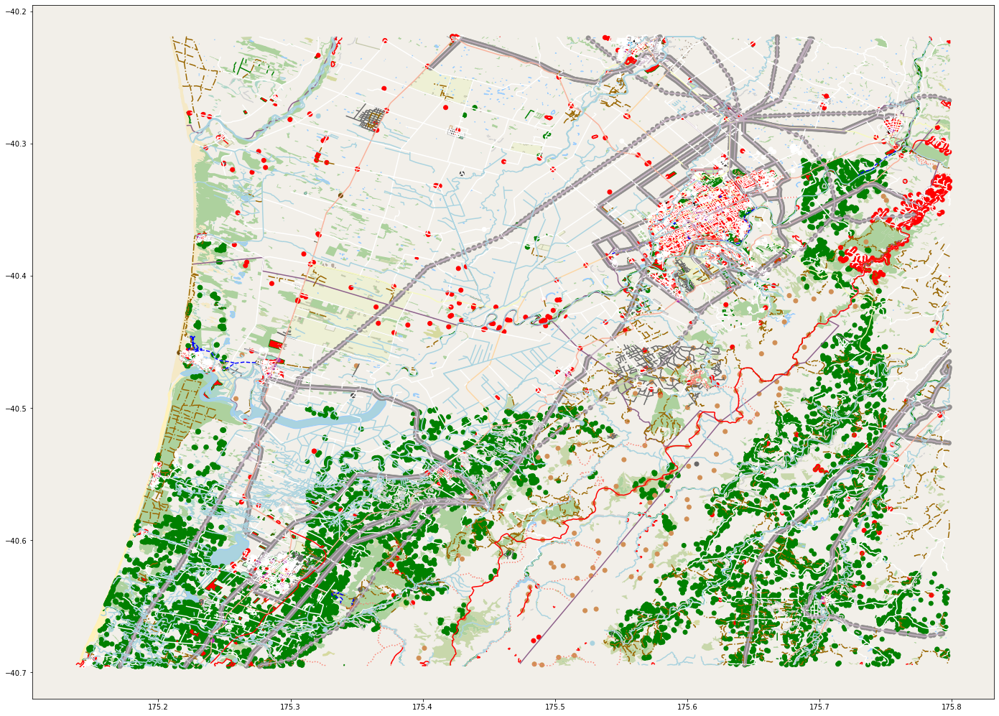

In [20]:
carto_plot(gdf)

### 5.1MB

https://www.openstreetmap.org/relation/2993498#map=11/-40.3690/176.7467

<AxesSubplot:>

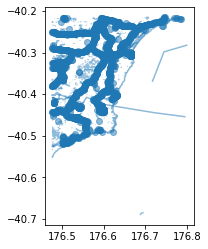

In [21]:
gdf = ox.geometries_from_xml(local_file_path + 'planet_176.475_-40.216_8df4ac4d.osm')
gdf.plot(alpha=0.5)

/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarn

(<Figure size 1728x1728 with 1 Axes>, <AxesSubplot:>)

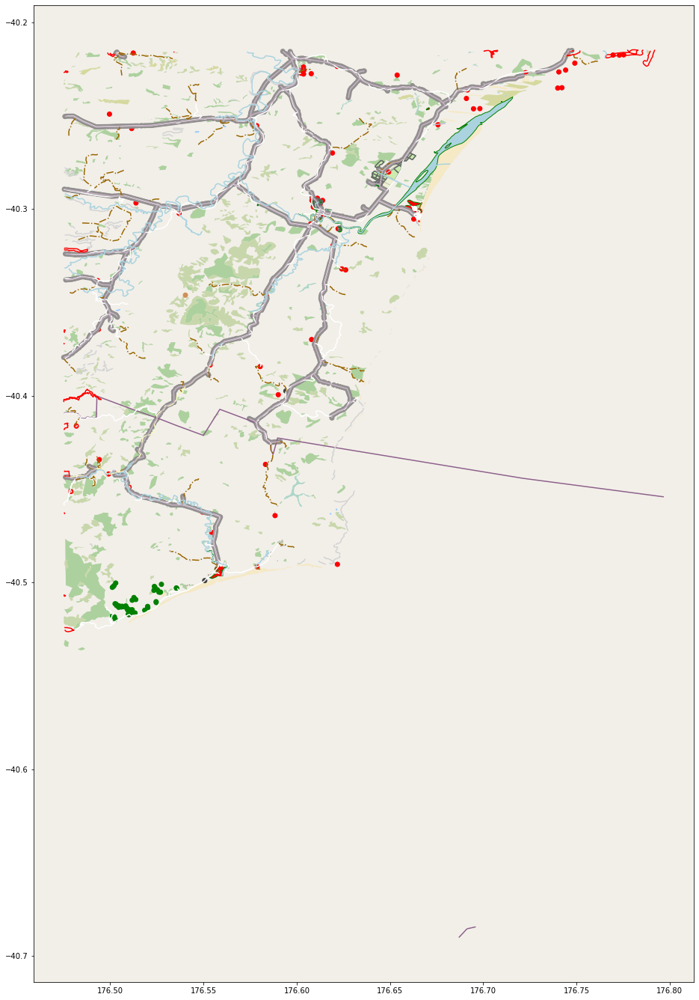

In [22]:
carto_plot(gdf)

### 30MB

https://www.openstreetmap.org/relation/2993498#map=11/-40.5253/176.0092

TopologyException: Input geom 0 is invalid: Self-intersection at or near point 175.79921652690612 -40.420455657466171 at 175.79921652690612 -40.420455657466171


The operation 'GEOSDifference_r' could not be performed. Likely cause is invalidity of the geometry <shapely.geometry.polygon.Polygon object at 0x7eff1aa52908> 
 MultiPolygon Relation OSM id 2732082 difference failed, trying with geometries buffered by 0.


<AxesSubplot:>

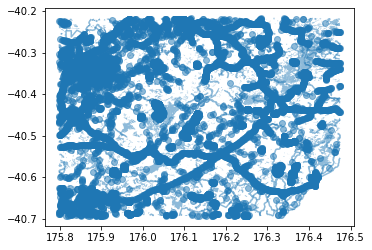

In [23]:
gdf = ox.geometries_from_xml(local_file_path + 'planet_176.475_-40.217_66299fa0.osm')
gdf.plot(alpha=0.5)

/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarn

(<Figure size 1728x1728 with 1 Axes>, <AxesSubplot:>)

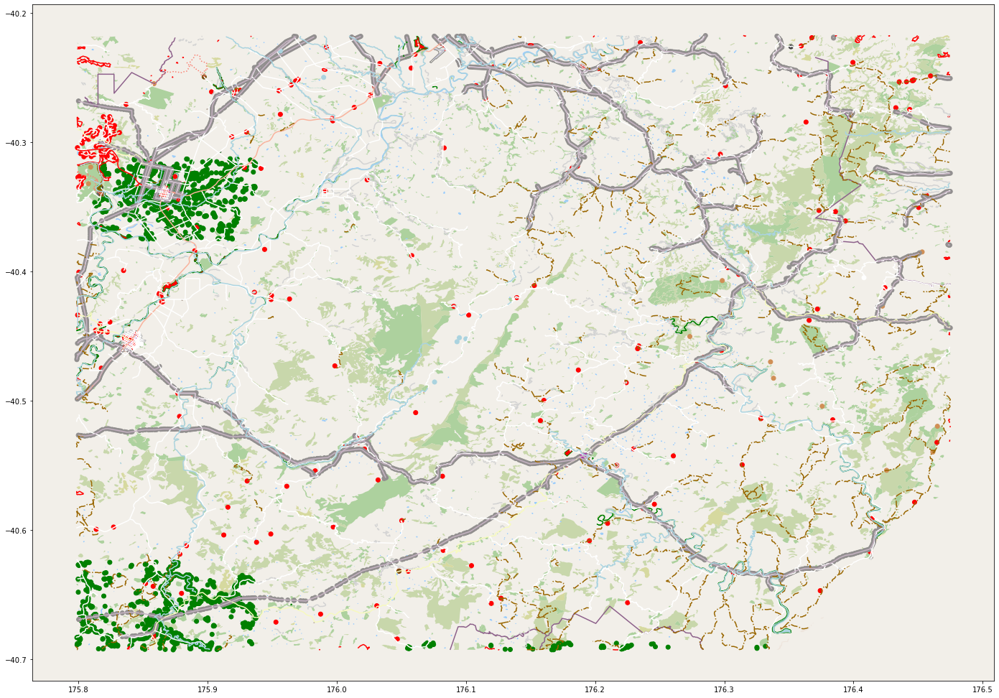

In [24]:
carto_plot(gdf)

### 92.4MB

https://www.openstreetmap.org/#map=13/55.9190/-3.2070

***Kernel crashes***

In [ ]:
gdf = ox.geometries_from_xml(local_file_path + 'planet_-3.207,55.919_-3.062,55.972.osm')
gdf.plot(alpha=0.5)

### 86.4MB

<AxesSubplot:>

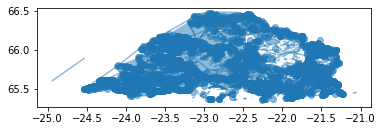

In [3]:
gdf = ox.geometries_from_xml(local_file_path + 'planet_-25.085_65.646_94af6d57.osm')
gdf.plot(alpha=0.5)

/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarn

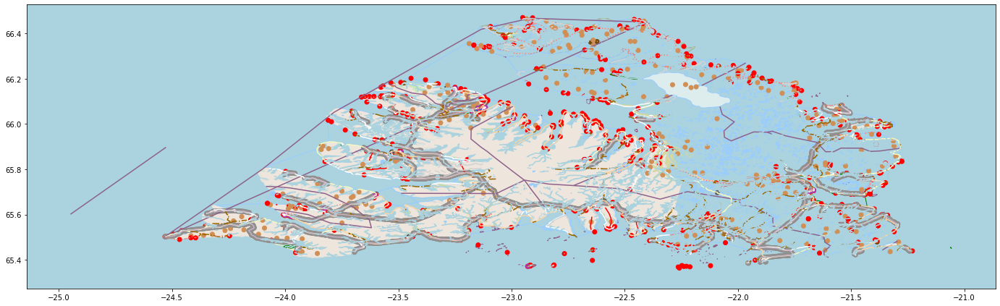

In [8]:
fig,ax = carto_plot(gdf)
ax.set_facecolor('#aad3df')

Note: main issue here is that https://www.openstreetmap.org/relation/7681889 is incomplete

In [9]:
tags={'place': True, 'natural': True, 'landuse': True,
      'leisure': True, 'amenity': True, 'waterway': True,
      'highway': True, 'aeroway': True, 'aerialway': True,
      'building': True, 'shop': True}
north, south, east, west = (66.5, 65.4, -21.2, -24.5)
gdf = ox.geometries_from_bbox(north, south, east, west, tags)

/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarn

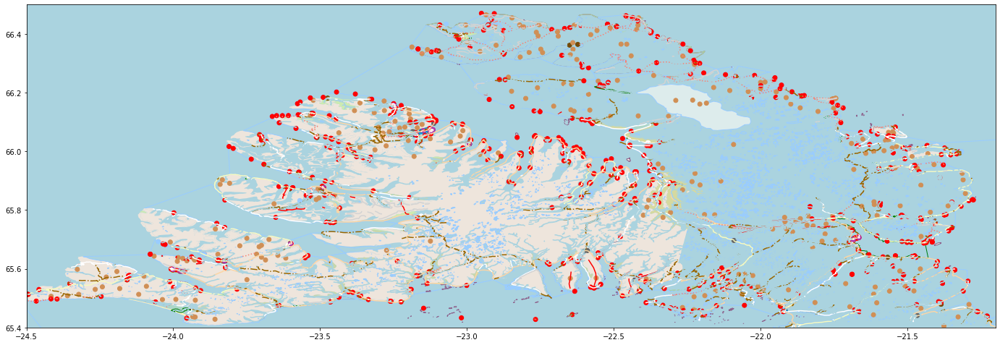

In [12]:
fig,ax = carto_plot(gdf, left=west, right=east, top=north, bottom=south)
ax.set_facecolor('#aad3df')

### 64.8MB

https://www.openstreetmap.org/#map=12/12.5076/-69.9297

<AxesSubplot:>

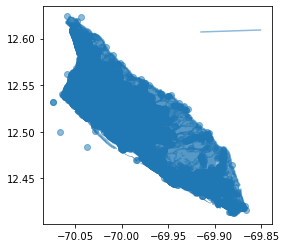

In [13]:
gdf = ox.geometries_from_xml(local_file_path + 'planet_-70.118,12.41_-69.763,12.625.osm')
gdf.plot(alpha=0.5)

/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


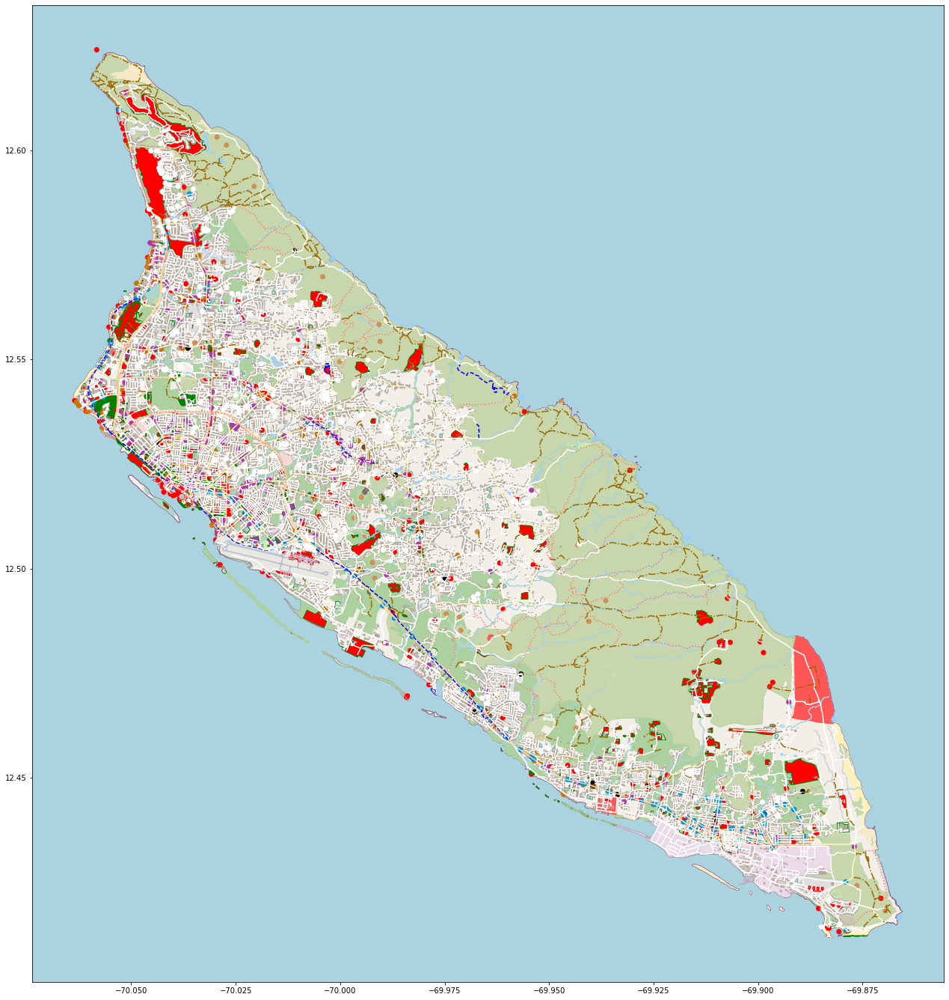

In [15]:
fig,ax = carto_plot(gdf, tags)
ax.set_facecolor('#aad3df')

###  91.8MB

***Note: Lots of strange geometries here - see https://www.openstreetmap.org/#map=8/63.340/-106.584***

TopologyException: Input geom 0 is invalid: Self-intersection at or near point -110.95809561846711 62.406490993512101 at -110.95809561846711 62.406490993512101


The operation 'GEOSDifference_r' could not be performed. Likely cause is invalidity of the geometry <shapely.geometry.polygon.Polygon object at 0x7f1ccd974908> 
 MultiPolygon Relation OSM id 1693116 difference failed, trying with geometries buffered by 0.


TopologyException: Input geom 0 is invalid: Self-intersection at or near point -110.95983414331427 62.884336301481156 at -110.95983414331427 62.884336301481156


The operation 'GEOSDifference_r' could not be performed. Likely cause is invalidity of the geometry <shapely.geometry.polygon.Polygon object at 0x7f1ccd931518> 
 MultiPolygon Relation OSM id 1711412 difference failed, trying with geometries buffered by 0.


TopologyException: Input geom 0 is invalid: Self-intersection at or near point -110.95839178346093 64.780909378504816 at -110.95839178346093 64.780909378504816


The operation 'GEOSDifference_r' could not be performed. Likely cause is invalidity of the geometry <shapely.geometry.polygon.Polygon object at 0x7f1ccd855be0> 
 MultiPolygon Relation OSM id 4563178 difference failed, trying with geometries buffered by 0.


<AxesSubplot:>

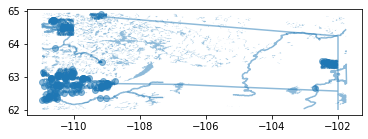

In [2]:
gdf = ox.geometries_from_xml(local_file_path + 'planet_-110.96,61.99_-101.73,64.92.osm')
gdf.plot(alpha=0.5)

/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarn

(<Figure size 1728x1728 with 1 Axes>, <AxesSubplot:>)

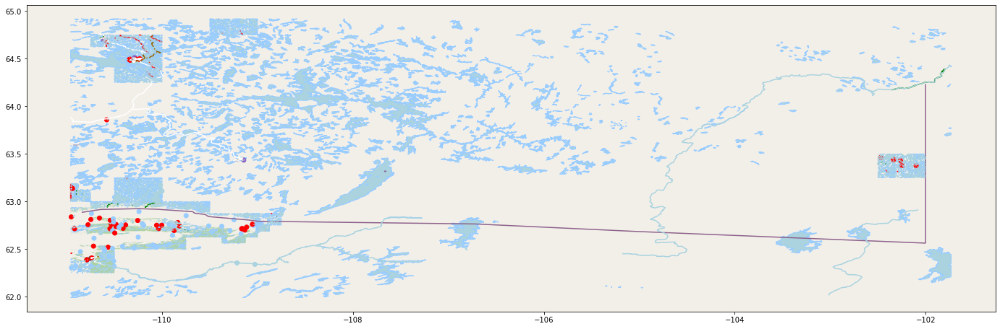

In [3]:
carto_plot(gdf)

### 2.5MB

https://www.openstreetmap.org/#map=15/40.6630/-112.0050

<AxesSubplot:>

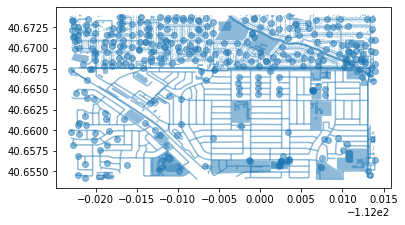

In [4]:
gdf = ox.geometries_from_xml(local_file_path + 'planet_-112.023,40.654_-111.986,40.674.osm')
gdf.plot(alpha=0.5)

/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/nick/anaconda3/envs/osmnx-dev/lib/python3.6/site-packages/geopandas/plotting.py:532: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarn

(<Figure size 1728x1728 with 1 Axes>, <AxesSubplot:>)

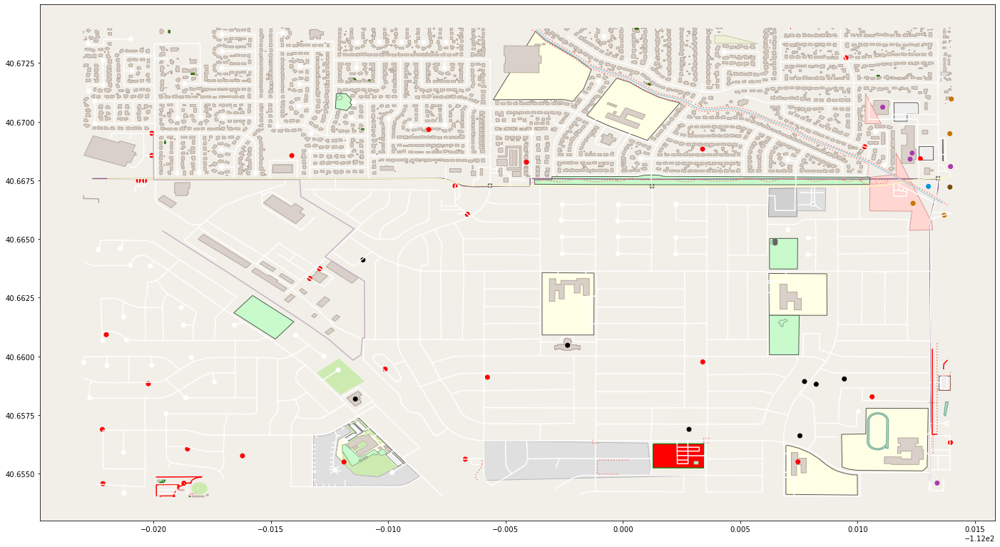

In [9]:
carto_plot(gdf)